In [7]:
import zipfile
import os

zip_path = r"C:\Users\lenovo\Desktop\fruit recognition\custom_images.zip"
extract_path = "custom_images"

# Extract
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Custom images extracted!")


Custom images extracted!


In [8]:
import numpy as np
import cv2
import os
import pickle
from tensorflow.keras.models import load_model

# --- Load PCA transformer ---
with open("pca_transformer.pkl", "rb") as f:
    pca = pickle.load(f)

# --- Load ANN model ---
model = load_model("fruit_ann_model.h5")

# --- Load class name mapping (list or dict-safe) ---
with open("class_names.pkl", "rb") as f:
    class_names = pickle.load(f)

if isinstance(class_names, dict):
    index_to_class = {v: k for k, v in class_names.items()}
elif isinstance(class_names, list):
    index_to_class = {i: name for i, name in enumerate(class_names)}
else:
    raise ValueError("Unsupported class_names format")

# --- Preprocess function ---
def preprocess_custom_image(img_path, img_size=(100, 100)):
    img = cv2.imread(img_path)
    if img is None:
        raise ValueError("Could not read image at path: " + img_path)
    img = cv2.resize(img, img_size)
    img = img.astype('float32') / 255.0  # Normalize
    img_flat = img.reshape(1, -1)  # Flatten
    img_pca = pca.transform(img_flat)
    return img_pca

# --- Predict all images in the folder ---
custom_dir = "custom_images"  # Make sure this folder exists
results = []

for img_name in os.listdir(custom_dir):
    img_path = os.path.join(custom_dir, img_name)
    if not img_name.lower().endswith((".png", ".jpg", ".jpeg")):
        continue  # Skip non-image files
    try:
        img_pca = preprocess_custom_image(img_path)
        pred_probs = model.predict(img_pca, verbose=0)
        pred_class = np.argmax(pred_probs)
        pred_label = index_to_class[pred_class]
        results.append((img_name, pred_label))
        print(f" {img_name} → Predicted: {pred_label}")
    except Exception as e:
        print(f" Error with {img_name}: {e}")

# --- Optionally print all results at once ---
print("\n--- Prediction Results ---")
for img, label in results:
    print(f"{img}: {label}")


 apple 1.jpg → Predicted: Caju seed 1
 apple 2.jpg → Predicted: Caju seed 1
 apple 3.jpg → Predicted: Caju seed 1
 banana 1.jpg → Predicted: Cucumber Ripe 1
 Banana 2.jpg → Predicted: Apple hit 1
 beetroot 1.jpg → Predicted: Banana Lady Finger 1
 beetroot 2.jpg → Predicted: Potato White 1
 cashews 1.jpg → Predicted: Apple 10
 coconut 1.jpg → Predicted: Caju seed 1
 coconut 2.jpg → Predicted: Potato White 1
 corn 1.jpg → Predicted: Kiwi 1
 corn 2.jpg → Predicted: Peach Flat 1
 ginger 1.jpg → Predicted: Caju seed 1
 ginger 2.jpg → Predicted: Quince 3
 Grapes 1.jpg → Predicted: Quince 3
 Grapes 2.jpg → Predicted: Cocos 1
 Lemon 1.jpg → Predicted: Apple Pink Lady 1
 Mango 1.jpg → Predicted: Quince 3
 mango 10.jpg → Predicted: Apple 10
 mango 11.jpg → Predicted: Tomato Maroon 1
 Mango 2.jpg → Predicted: Quince 3
 Mango 3.jpg → Predicted: Quince 3
 Mango 4.jpg → Predicted: Pistachio 1
 mango 5.jpg → Predicted: Pineapple Mini 1
 mango 6.jpg → Predicted: Pineapple Mini 1
 mango 7.jpg → Predict

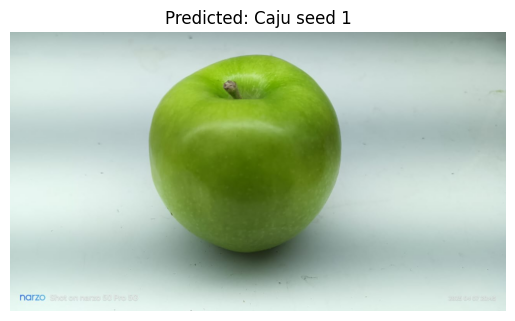

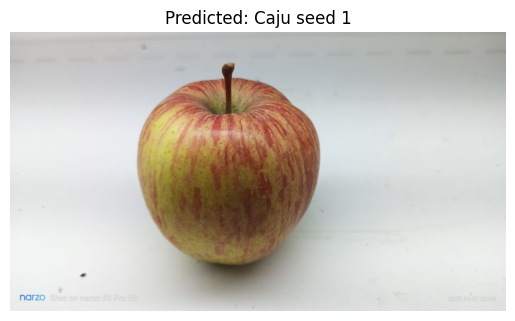

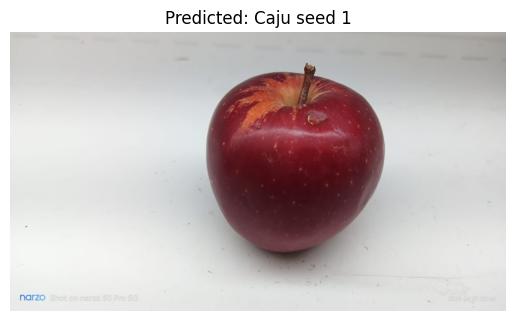

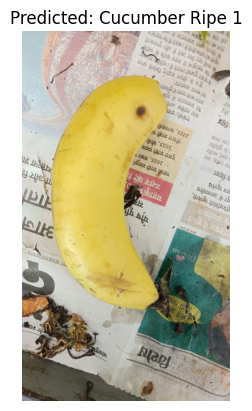

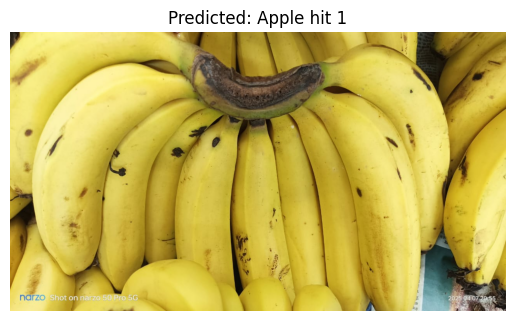

...

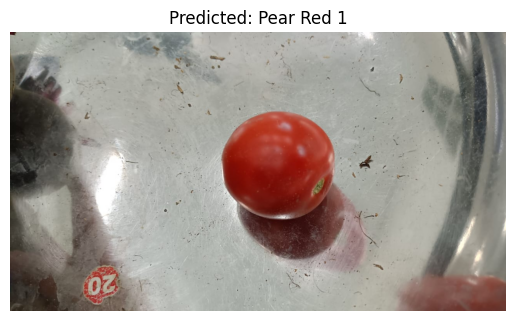

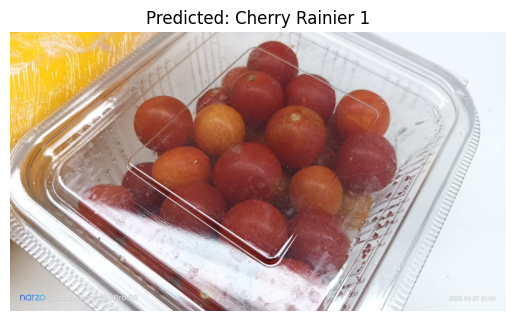

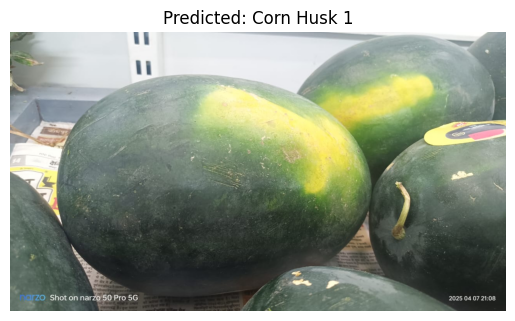

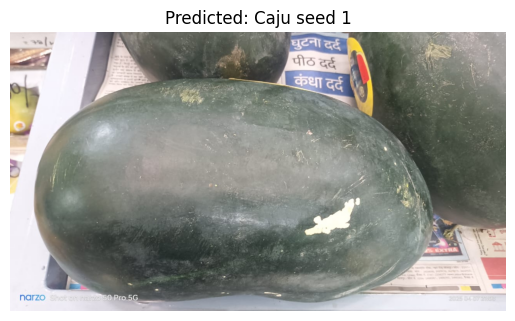

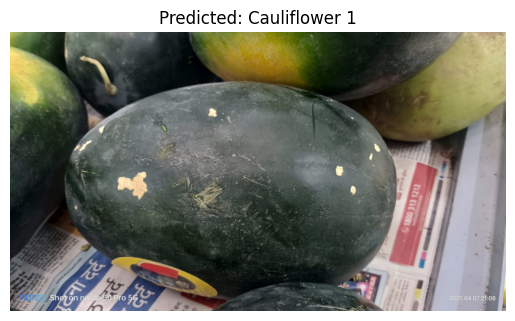

In [9]:
import matplotlib.pyplot as plt

for img_name, label in results:
    img_path = os.path.join(custom_dir, img_name)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title(f"Predicted: {label}")
    plt.axis('off')
    plt.show()


In [10]:
from pathlib import Path

def get_clean_label(text):
    return text.lower().split()[0]  # Just the first word, lowercase

custom_dir = "custom_images"
correct = 0
total = 0
results = []

for img_name in os.listdir(custom_dir):
    if not img_name.lower().endswith((".png", ".jpg", ".jpeg")):
        continue

    img_path = os.path.join(custom_dir, img_name)

    try:
        # True label from filename
        true_label = get_clean_label(Path(img_name).stem)

        # Predict using PCA + ANN
        img_pca = preprocess_custom_image(img_path)
        pred_probs = model.predict(img_pca, verbose=0)
        pred_class = np.argmax(pred_probs)
        pred_label_raw = index_to_class[pred_class]
        pred_label = get_clean_label(pred_label_raw)

        results.append((img_name, pred_label, true_label))

        if pred_label == true_label:
            correct += 1
        total += 1

        print(f" {img_name} → Predicted: {pred_label_raw} → Match: {pred_label == true_label}")

    except Exception as e:
        print(f" Error processing {img_name}: {e}")

# --- Final Accuracy ---
accuracy = correct / total if total > 0 else 0
print(f"\n Custom Image Accuracy: {accuracy * 100:.2f}% ({correct}/{total})")


 apple 1.jpg → Predicted: Caju seed 1 → Match: False
 apple 2.jpg → Predicted: Caju seed 1 → Match: False
 apple 3.jpg → Predicted: Caju seed 1 → Match: False
 banana 1.jpg → Predicted: Cucumber Ripe 1 → Match: False
 Banana 2.jpg → Predicted: Apple hit 1 → Match: False
 beetroot 1.jpg → Predicted: Banana Lady Finger 1 → Match: False
 beetroot 2.jpg → Predicted: Potato White 1 → Match: False
 cashews 1.jpg → Predicted: Apple 10 → Match: False
 coconut 1.jpg → Predicted: Caju seed 1 → Match: False
 coconut 2.jpg → Predicted: Potato White 1 → Match: False
 corn 1.jpg → Predicted: Kiwi 1 → Match: False
 corn 2.jpg → Predicted: Peach Flat 1 → Match: False
 ginger 1.jpg → Predicted: Caju seed 1 → Match: False
 ginger 2.jpg → Predicted: Quince 3 → Match: False
 Grapes 1.jpg → Predicted: Quince 3 → Match: False
 Grapes 2.jpg → Predicted: Cocos 1 → Match: False
 Lemon 1.jpg → Predicted: Apple Pink Lady 1 → Match: False
 Mango 1.jpg → Predicted: Quince 3 → Match: False
 mango 10.jpg → Predicted